# Online Shoppers Purchasing Intention
Sakar, C.O., Polat, S.O., Katircioglu, M. et al. Neural Comput & Applic (2018). [https://link.springer.com/article/10.1007%2Fs00521-018-3523-0]
* https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset
* https://www.kaggle.com/roshansharma/online-shoppers-intention

## Init

In [182]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [131]:
from sklearn.preprocessing import LabelEncoder, RobustScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

In [132]:
df = pd.read_csv('C:/Users/lenovo/Downloads/my notebook/online_shoppers_intention.csv')

In [133]:
df.shape

(12330, 18)

In [134]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12316 non-null  float64
 1   Administrative_Duration  12316 non-null  float64
 2   Informational            12316 non-null  float64
 3   Informational_Duration   12316 non-null  float64
 4   ProductRelated           12316 non-null  float64
 5   ProductRelated_Duration  12316 non-null  float64
 6   BounceRates              12316 non-null  float64
 7   ExitRates                12316 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

## Context

The purchasing intention model is designed as a binary classification problem measuring the user’s
intention to finalize the transaction.
The dataset consists of feature vectors belonging to 12,330 sessions.
__The dataset was formed so that each session
would belong to a different user in a 1-year period to avoid
any tendency to a specific campaign, special day, user
profile, or period.__

**The dataset consists of 10 numerical and 8 categorical attributes.**
* The 'Revenue' attribute can be used as the class label.
* "Administrative", "Administrative Duration", "Informational", "Informational Duration", "Product Related" and "Product Related Duration" represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another. 
* The "Bounce Rate", "Exit Rate" and "Page Value" features represent the metrics measured by "Google Analytics" for each page in the e-commerce site. The value of "Bounce Rate" feature for a web page refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session. The value of "Exit Rate" feature for a specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session. The "Page Value" feature represents the average value for a web page that a user visited before completing an e-commerce transaction. 
* The "Special Day" feature indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentine’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8. 
* The dataset also includes operating system, browser, region, traffic type, visitor type as returning or new visitor, a Boolean value indicating whether the date of the visit is weekend, and month of the year.

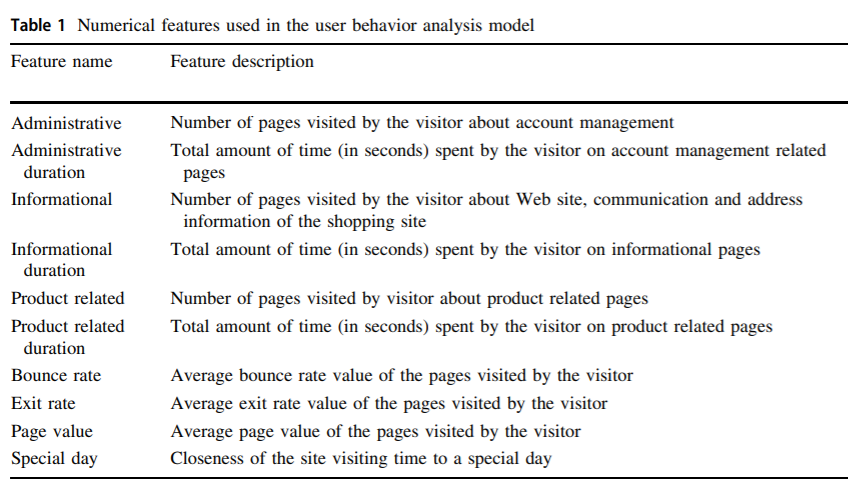

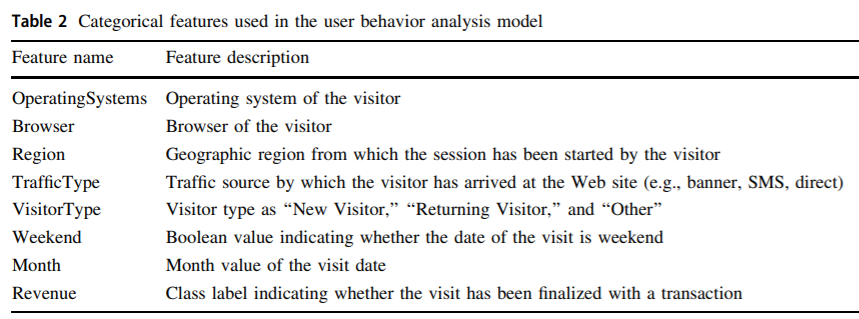

A single user can open multiple **sessions**. Those sessions can occur on the same day, or over several days, weeks, or months. As soon as one session ends, there is then an opportunity to start a new session. There are two methods by which a session ends:

Time-based expiration:
* After 30 minutes of inactivity
* At midnight
<br>

Campaign change:
* If a user arrives via one campaign, leaves, and then comes back via a different campaign.

[https://support.google.com/analytics/answer/2731565]

A pageview (or pageview hit, page tracking hit) is an instance of a page being loaded (or reloaded) in a browser. **Pageviews** is a metric defined as the total number of pages viewed.

[https://support.google.com/analytics/answer/6086080?hl=en]

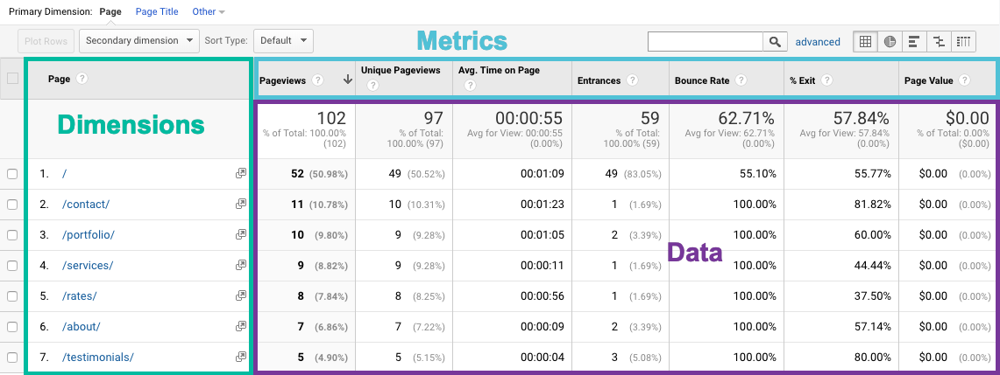

To understand the difference between Exit Rate and Bounce Rate for a particular page, keep the following points in mind:

* For all pageviews to the page, **Exit** Rate is the percentage that were the last in the session.
* For all sessions that start with the page, **Bounce Rate** is the percentage that were the only one of the session.
* Bounce Rate for a page is based only on sessions that start with that page.  

[https://support.google.com/analytics/answer/2525491?hl=en]

Bouncing and exiting are two completely different, independent concepts. DO NOT confuse the two.

* Bounce rate refers to the first page a visitor enters, and exit rate to the last page he visits before he leaves;
* Bounces are ALWAYS one-page visits; exits can be more than one-page visits;
* A high exit rate doesn’t mean a high bounce rate (users might be coming to that page from elsewhere on the site before exiting);
* A low exit rate may (users must be going on to other pages on the site before they leave);
* Bounce rate is a negative for most websites (points out that the landing page isn’t relevant to your visitors);
* Exit rate can be either positive or negative (people may be driven to an online user publication to read a specific article, they find the page they need, read the article, and then they leave. This is not necessarily a negative).

[https://canonicalized.com/bounce-rate-vs-exit-rate/]

**Page Value** is the average value for a page that a user visited before landing on the goal page or completing an Ecommerce transaction (or both). This value is intended to give you an idea of which page in your site contributed more to your site's revenue. If the page wasn't involved in an ecommerce transaction for your website in any way, then the Page Value for that page will be $0 since the page was never visited in a session where a transaction occurred.

[https://support.google.com/analytics/answer/2695658?hl=en&ref_topic=6156780]

Your pages should have a purpose. Some pages sell stuff / convert and some merely inform readers about a certain topic. Others assist in making a conversion. If pages that are meant to sell or convert have a low page value, something is going wrong. And if you see that pages you’re not actively using in your strategy have a high Page Value, you might want to consider adding that page to your strategy.

It also works the other way around. If you notice that some pages have a lower than expected Page Value, then these pages are driving people away from a conversion. The same goes for pages with high traffic but low Page Value, and pages with low traffic but high Page Value. As you might’ve guessed, looking at page value is insightful and useful to optimize your conversions!

[https://yoast.com/what-is-page-value-in-google-analytics/]

Google Analytics’ channel groupings classify your **traffic** so you can track the performance of individual channels like organic, paid, direct, social, email, etc. This helps show where the largest audiences are coming from and what channels are struggling.

[https://databox.com/the-most-tracked-google-analytics-metrics]

Numerous studies have shown that websites tend to have more **new visitors** and fewer **returning visitors**. But the returning visitors tend to have higher engagement — they bounce less, view more pages per session, and have higher session durations. They also tend to have higher conversion rates and higher sales…much higher. This makes us want more returning visitors.
[https://help.analyticsedge.com/howto/meaningful-metrics-google-analytics-new-vs-returning-visitors/]

In [136]:
temp = []

for i in df.columns:
    temp.append([i,
                 df[i].dtypes,
                 df[i].isna().sum(),
                 round(df[i].isna().sum()/len(df)*100, 2),
                 df[i].nunique(),
                 df[i].drop_duplicates().sample(2).values
                ])

pd.DataFrame(temp, columns = ['feature', 'dtype', 'null', '% null', 'n unique', 'sample'])

,feature,dtype,null,% null,n unique,sample
0,Administrative,float64,14,0.11,27,"[24.0, 7.0]"
1,Administrative_Duration,float64,14,0.11,3336,"[43.625, 181.6]"
2,Informational,float64,14,0.11,17,"[6.0, 11.0]"
3,Informational_Duration,float64,14,0.11,1259,"[141.0, 58.95238095]"
4,ProductRelated,float64,14,0.11,311,"[15.0, 279.0]"
5,ProductRelated_Duration,float64,14,0.11,9552,"[5962.205556, 2074.611111]"
6,BounceRates,float64,14,0.11,1872,"[0.006174089000000001, 0.019767442]"
7,ExitRates,float64,14,0.11,4777,"[0.017959184, 0.011728395]"
8,PageValues,float64,0,0.00,2704,"[14.50274386, 13.91046998]"
9,SpecialDay,float64,0,0.00,6,"[0.8, 0.2]"


## Cleaning - EDA - Viz

In [137]:
df[df['Administrative'].isna()]

# this is all NaN
# consider to drop these rows due to absence of all numerical feats -- useless + negative class, no positive

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
1065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,2,2,1,Returning_Visitor,False,False
1132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,1,1,1,2,Returning_Visitor,False,False
1133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,4,5,1,Returning_Visitor,False,False
1134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,2,1,2,Returning_Visitor,False,False
1135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,3,2,1,1,Returning_Visitor,False,False
1136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,2,1,2,Returning_Visitor,False,False
1473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,2,1,1,Returning_Visitor,True,False
1474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,1,1,6,1,Returning_Visitor,True,False
1475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,2,2,3,1,Returning_Visitor,False,False
1476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Mar,1,1,2,3,Returning_Visitor,False,False


In [138]:
df = df.dropna(how='any')

In [139]:
df.isna().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [140]:
dur = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration']
for col in dur:
    print(df[df[col] < 0].shape[0])

df[df['Administrative_Duration'] < 0].index == df[df['Informational_Duration'] < 0].index
df[df['Administrative_Duration'] < 0].index == df[df['ProductRelated_Duration'] < 0].index
# turns out it belongs to the same record

33
33
33


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [141]:
# consider to impute 0, -1 seconds is invalid value

print(df[df['Administrative_Duration'] < 0].index)

Int64Index([   2,    6,    7,   16,   21,   24,   49,   50,   64,  132,  140,
             181,  182,  252,  383,  532,  540,  562,  591,  638, 2046, 2052,
            2061, 4799, 4915, 5095, 5096, 5107, 5124, 6260, 7210, 8052, 8636],
           dtype='int64')


In [142]:
df['Administrative_Duration'] = df['Administrative_Duration'].apply(lambda x: 0 if x < 0 else x)
df['Informational_Duration'] = df['Informational_Duration'].apply(lambda x: 0 if x < 0 else x)
df['ProductRelated_Duration'] = df['ProductRelated_Duration'].apply(lambda x: 0 if x < 0 else x)

In [143]:
df[df.duplicated()]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
158,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Feb,1,1,1,3,Returning_Visitor,False,False
159,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
178,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
418,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Mar,1,1,1,1,Returning_Visitor,True,False
456,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Mar,2,2,4,1,Returning_Visitor,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11934,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Dec,1,1,1,2,New_Visitor,False,False
11938,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Dec,1,1,4,1,Returning_Visitor,True,False
12159,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Dec,1,1,1,3,Returning_Visitor,False,False
12180,0.0,0.0,0.0,0.0,1.0,0.0,0.2,0.2,0.0,0.0,Dec,1,13,9,20,Returning_Visitor,False,False


In [144]:
print(df[df.duplicated()].shape[0])
list(df[df.duplicated()].index)

# consider just keep 1 record, drop others

125


[158,
 159,
 178,
 418,
 456,
 483,
 512,
 540,
 554,
 589,
 659,
 720,
 774,
 872,
 889,
 922,
 947,
 956,
 974,
 1034,
 1119,
 1170,
 1176,
 1213,
 1214,
 1285,
 1291,
 1325,
 1356,
 1366,
 1381,
 1390,
 1394,
 1436,
 1453,
 1515,
 1560,
 1573,
 1608,
 1697,
 1775,
 1804,
 1839,
 1866,
 1925,
 1933,
 1949,
 2056,
 2057,
 2061,
 2235,
 2621,
 2739,
 3231,
 3272,
 3281,
 3577,
 3650,
 3663,
 3721,
 3891,
 4163,
 4182,
 4231,
 4343,
 4374,
 4403,
 4426,
 4463,
 4489,
 4552,
 4817,
 4883,
 4913,
 5038,
 5043,
 5056,
 5118,
 5198,
 5199,
 5254,
 5276,
 5286,
 5355,
 5407,
 6929,
 7151,
 7635,
 8544,
 9306,
 9494,
 9551,
 9568,
 9581,
 9718,
 9769,
 9878,
 9907,
 10146,
 10222,
 10269,
 10572,
 10631,
 10751,
 10795,
 10841,
 10988,
 11043,
 11121,
 11205,
 11404,
 11523,
 11581,
 11624,
 11658,
 11733,
 11747,
 11801,
 11813,
 11827,
 11934,
 11938,
 12159,
 12180,
 12185]

In [145]:
# drop n-1 dupes

df.drop(index=[159,
 178,
 418,
 456,
 483,
 512,
 540,
 554,
 589,
 659,
 720,
 774,
 872,
 889,
 922,
 947,
 956,
 974,
 1034,
 1119,
 1170,
 1176,
 1213,
 1214,
 1285,
 1291,
 1325,
 1356,
 1366,
 1381,
 1390,
 1394,
 1436,
 1453,
 1515,
 1560,
 1573,
 1608,
 1697,
 1775,
 1804,
 1839,
 1866,
 1925,
 1933,
 1949,
 2056,
 2057,
 2061,
 2235,
 2621,
 2739,
 3231,
 3272,
 3281,
 3577,
 3650,
 3663,
 3721,
 3891,
 4163,
 4182,
 4231,
 4343,
 4374,
 4403,
 4426,
 4463,
 4489,
 4552,
 4817,
 4883,
 4913,
 5038,
 5043,
 5056,
 5118,
 5198,
 5199,
 5254,
 5276,
 5286,
 5355,
 5407,
 6929,
 7151,
 7635,
 8544,
 9306,
 9494,
 9551,
 9568,
 9581,
 9718,
 9769,
 9878,
 9907,
 10146,
 10222,
 10269,
 10572,
 10631,
 10751,
 10795,
 10841,
 10988,
 11043,
 11121,
 11205,
 11404,
 11523,
 11581,
 11624,
 11658,
 11733,
 11747,
 11801,
 11813,
 11827,
 11934,
 11938,
 12159,
 12180,
 12185], inplace = True)

In [146]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12192 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12192 non-null  float64
 1   Administrative_Duration  12192 non-null  float64
 2   Informational            12192 non-null  float64
 3   Informational_Duration   12192 non-null  float64
 4   ProductRelated           12192 non-null  float64
 5   ProductRelated_Duration  12192 non-null  float64
 6   BounceRates              12192 non-null  float64
 7   ExitRates                12192 non-null  float64
 8   PageValues               12192 non-null  float64
 9   SpecialDay               12192 non-null  float64
 10  Month                    12192 non-null  object 
 11  OperatingSystems         12192 non-null  int64  
 12  Browser                  12192 non-null  int64  
 13  Region                   12192 non-null  int64  
 14  TrafficType           

In [147]:
df[dur].describe()

# unit = seconds

,Administrative_Duration,Informational_Duration,ProductRelated_Duration
count,12192.000000,12192.000000,12192.000000
mean,81.731748,34.860045,1208.204182
std,177.567081,141.495965,1920.258785
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,194.188095
50%,9.000000,0.000000,610.471429
75%,94.835000,0.000000,1478.326191
max,3398.750000,2549.375000,63973.522230


In [148]:
# convert to hours

print([3398.750000/3600,
2549.375000/3600,
63973.522230/3600])

# seems reasonable, product related page can get up to 17 hour view (even this is outlier)

[0.9440972222222223, 0.7081597222222222, 17.77042284166667]


In [149]:
# rates unit = percent
# pagevalues unit = $

df[['BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']].describe()

# rates should not exceed 1 or 100%
# $ value is continuous from 0 onwards
# special day in range 0-1

,BounceRates,ExitRates,PageValues,SpecialDay
count,12192.000000,12192.000000,12192.000000,12192.000000
mean,0.020344,0.041406,5.955918,0.062008
std,0.045211,0.046104,18.662602,0.199762
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.014215,0.000000,0.000000
50%,0.002899,0.025000,0.000000,0.000000
75%,0.016667,0.048372,0.000000,0.000000
max,0.200000,0.200000,361.763742,1.000000


In [150]:
num_feats = ['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']

cat_feats = ['Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend']

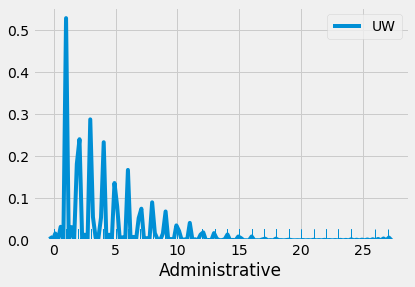

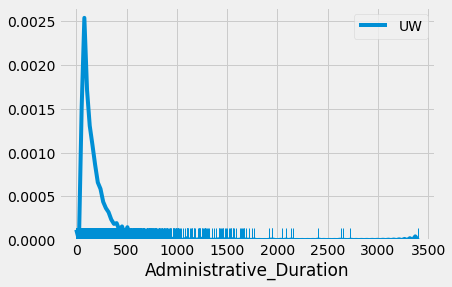

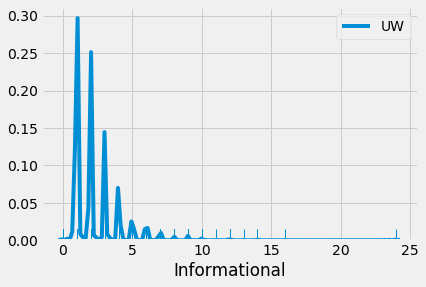

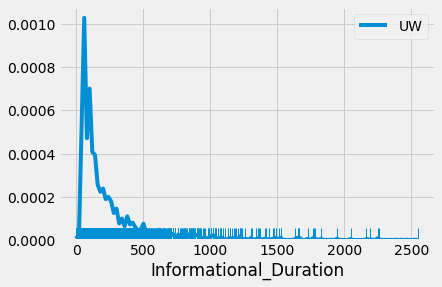

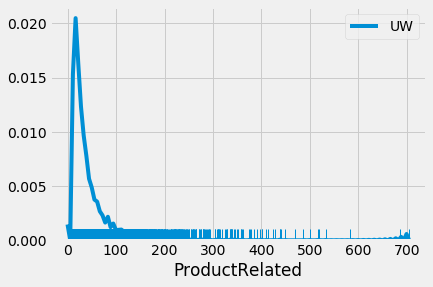

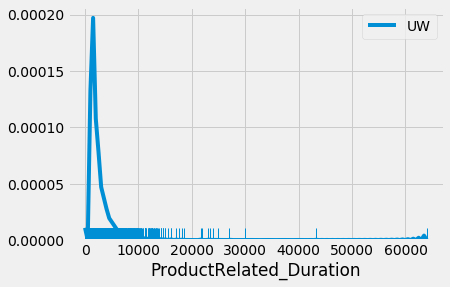

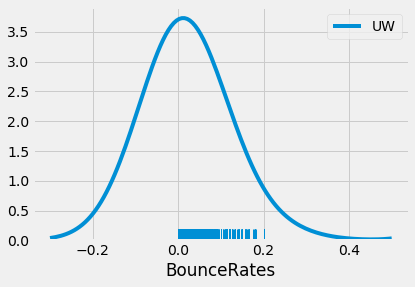

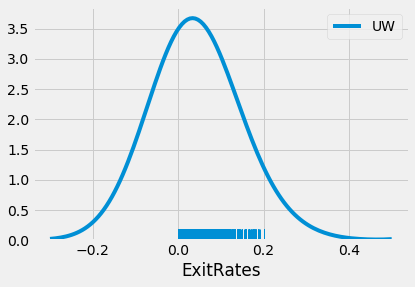

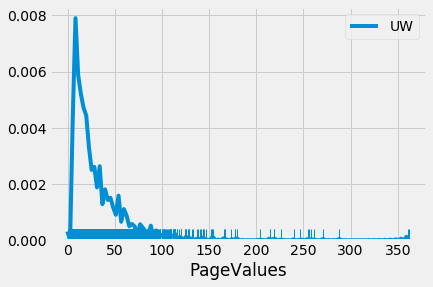

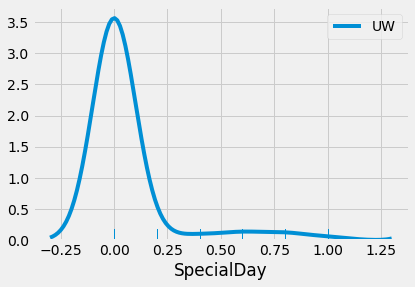

In [151]:
for column in num_feats:
    sns.distplot(df[column], rug=True, hist=False, label='UW', kde_kws={'bw':0.1})
    plt.show()
    
# lots of features with zeros

In [152]:
from scipy.stats import shapiro
def normal_shapiro(df, col, alpha):
    '''Function to identify outliers in a column based on interquantile range (IQR)
       df = Dataset name
       col = Column name
       alpha = Threshold level (float)'''
    
    stat, p = shapiro(df[col])
    print(col)
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > alpha:
        print('Distribution looks Gaussian (fail to reject H0)')
    else:
        print('Distribution does not look Gaussian (reject H0)')
    print('\n')

In [153]:
for feat in num_feats:
    normal_shapiro(df, feat, 0.05)

Administrative
Statistics=0.738, p=0.000
Distribution does not look Gaussian (reject H0)


Administrative_Duration
Statistics=0.484, p=0.000
Distribution does not look Gaussian (reject H0)


Informational
Statistics=0.461, p=0.000
Distribution does not look Gaussian (reject H0)


Informational_Duration
Statistics=0.262, p=0.000
Distribution does not look Gaussian (reject H0)


ProductRelated
Statistics=0.611, p=0.000
Distribution does not look Gaussian (reject H0)


ProductRelated_Duration
Statistics=0.556, p=0.000
Distribution does not look Gaussian (reject H0)


BounceRates
Statistics=0.484, p=0.000
Distribution does not look Gaussian (reject H0)


ExitRates
Statistics=0.702, p=0.000
Distribution does not look Gaussian (reject H0)


PageValues
Statistics=0.357, p=0.000
Distribution does not look Gaussian (reject H0)


SpecialDay
Statistics=0.345, p=0.000
Distribution does not look Gaussian (reject H0)




C:\Users\lenovo\anaconda3\lib\site-packages\scipy\stats\morestats.py:1676: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


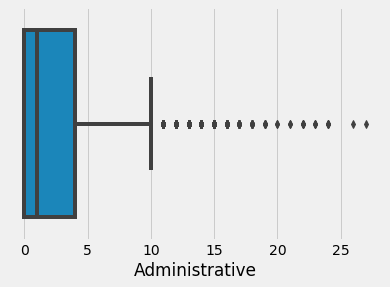

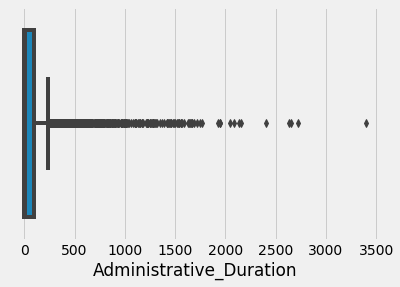

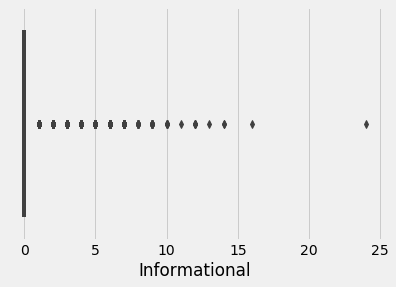

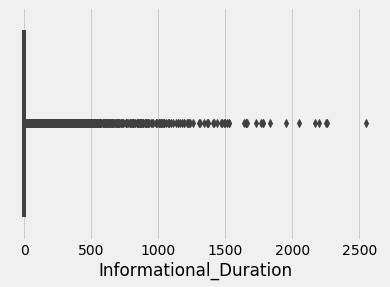

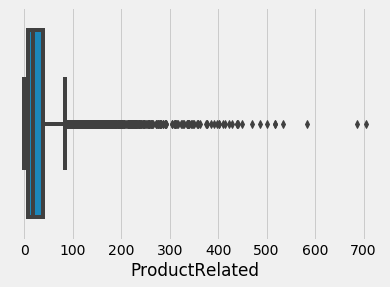

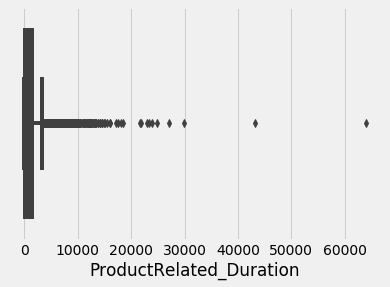

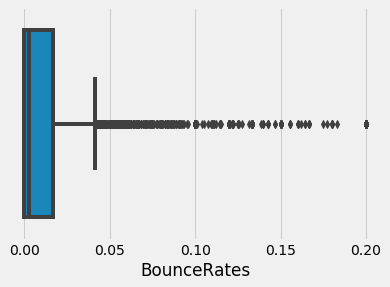

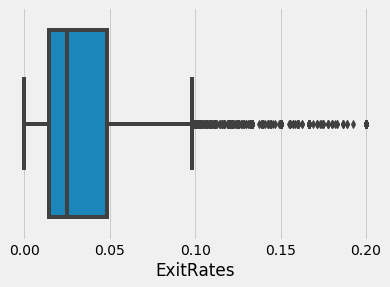

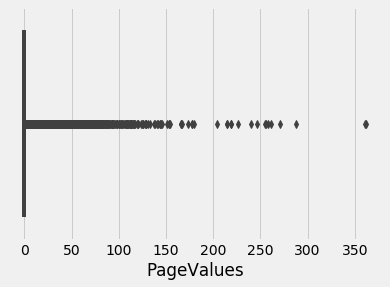

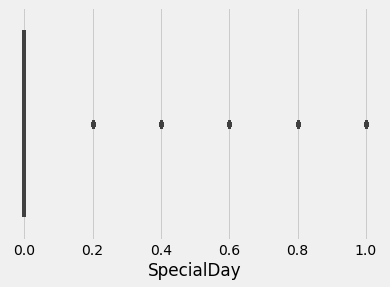

In [154]:
for column in num_feats:
    sns.boxplot(df[column])
    plt.show()

In [155]:
# def mark_out(df, col):
#     '''Function to mark outlier (1, if not 0) based on interquantile range (IQR)'''
    
#     q1 = df[col].describe()['25%']
#     q3 = df[col].describe()['75%']
#     iqr = q3 - q1
#     lower = q1 - 1.5*iqr
#     upper = q3 + 1.5*iqr

#     return list(1 if (x <= lower) | (x >= upper) else 0 for x in df[col])

In [156]:
# for column in df_num.columns:
#     df[f'{column}_outlier'] = mark_out(df, column)

# df

In [157]:
def out_iqr(df, col):
    '''Function to identify outliers in a column based on interquantile range (IQR)
       df = Dataset name
       col = Column name'''
    
    q1 = df[col].describe()['25%']
    q3 = df[col].describe()['75%']
    iqr = q3 - q1
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr
    
    n_out = df[(df[col]<=lower)|(df[col]>=upper)].shape[0]
    n_pct = round(n_out/len(df[col])*100, 2)
    
    return 'n outlier in {}: {} records, {} percent, threshold lower: {} upper: {}'.format(col, n_out, n_pct, lower, upper)

In [158]:
for column in num_feats:
    print(out_iqr(df, column))
    
# statistically large number of outliers are identified as below,
# but as long as the value is not invalid for the feature they will be kept
# for feats with many zeros especially, Q1=Q2=Q3 causing every record to be outlier

n outlier in Administrative: 557 records, 4.57 percent, threshold lower: -6.0 upper: 10.0
n outlier in Administrative_Duration: 1145 records, 9.39 percent, threshold lower: -142.25249999625 upper: 237.08749999375001
n outlier in Informational: 12192 records, 100.0 percent, threshold lower: 0.0 upper: 0.0
n outlier in Informational_Duration: 12192 records, 100.0 percent, threshold lower: 0.0 upper: 0.0
n outlier in ProductRelated: 1028 records, 8.43 percent, threshold lower: -37.0 upper: 83.0
n outlier in ProductRelated_Duration: 951 records, 7.8 percent, threshold lower: -1732.0190480625 upper: 3404.5333340375
n outlier in BounceRates: 1424 records, 11.68 percent, threshold lower: -0.0250000005 upper: 0.041666667500000004
n outlier in ExitRates: 1320 records, 10.83 percent, threshold lower: -0.03702054875 upper: 0.09960696525000001
n outlier in PageValues: 12192 records, 100.0 percent, threshold lower: 0.0 upper: 0.0
n outlier in SpecialDay: 12192 records, 100.0 percent, threshold lowe

In [159]:
# out_cols = ['Administrative_outlier',
#        'Administrative_Duration_outlier', 'Informational_outlier',
#        'Informational_Duration_outlier', 'ProductRelated_outlier',
#        'ProductRelated_Duration_outlier', 'BounceRates_outlier',
#        'ExitRates_outlier', 'PageValues_outlier', 'SpecialDay_outlier']

# for column in out_cols:
#     print(df[column].sum())

# check sum marked outliers == identified outliers

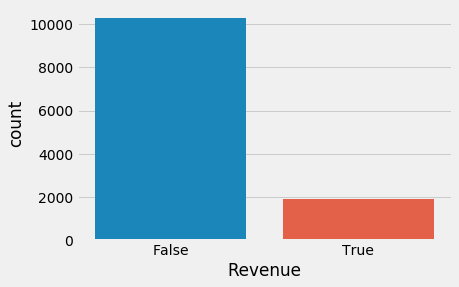

In [160]:
sns.countplot(df['Revenue'])

In [161]:
df['Revenue'].value_counts().apply(lambda x: str(round(x/df['Revenue'].value_counts().sum()*100, 2))+'%')

False    84.35%
True     15.65%
Name: Revenue, dtype: object

This dataset is imbalanced, class label 'True': 'False' = 16:84 <br>
"Imbalanced Classification: A classification predictive modeling problem where the distribution of examples across the classes is not equal." [https://machinelearningmastery.com/what-is-imbalanced-classification/]<br>
'This class imbalance
problem is a natural situation for the analyzed problem
since most of the e-commerce visits do not end with
shopping. Therefore, alternative metrics that take the
class imbalanced into account such as F1 Score should be
used to evaluate the performance of the classifiers." - Sakar, 2018

* 'True' --> Minority class
* 'False' --> Majority class

###### The class or classes with abundant examples are called the major or majority classes, whereas the class with few examples (and there is typically just one) is called the minor or minority class.<br>

* Majority Class: The class (or classes) in an imbalanced classification predictive modeling problem that has many examples.
* Minority Class: The class in an imbalanced classification predictive modeling problem that has few examples.

###### When working with an imbalanced classification problem, the minority class is typically of the most interest. This means that a model’s skill in correctly predicting the class label or probability for the minority class is more important than the majority class or classes.

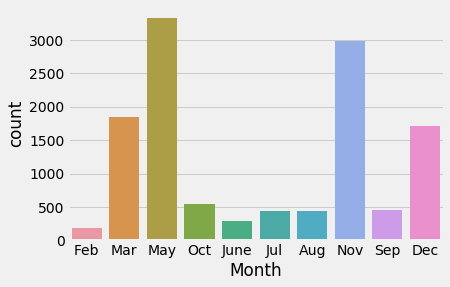

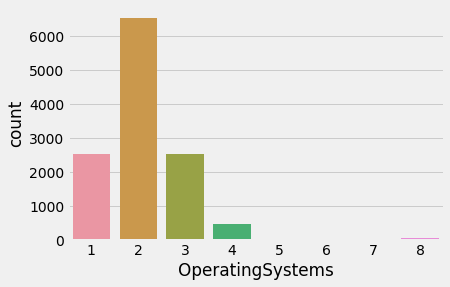

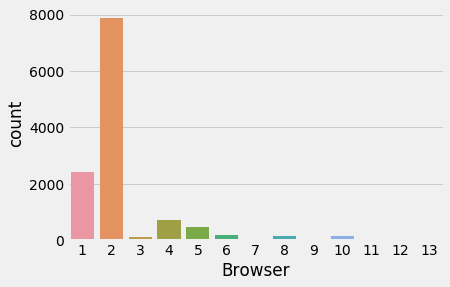

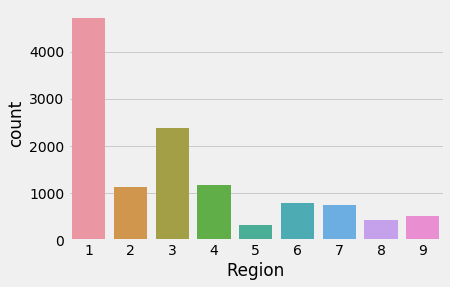

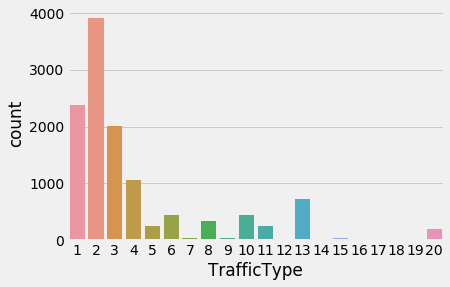

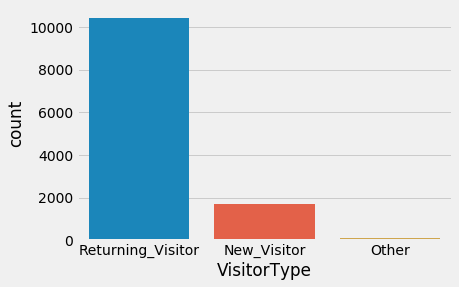

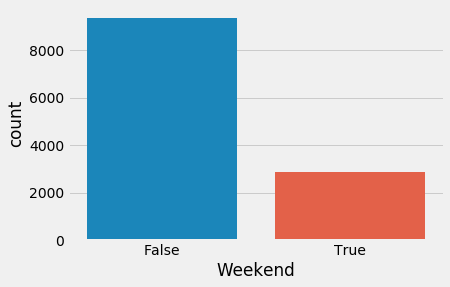

In [162]:
for column in cat_feats:
    sns.countplot(df[column])
    plt.show()

What is exactly VisitorType='Other'? Consider deleting these records, Google Analytics only has Returning/New Visitors<br>
To prevent overfitting, we can consider combining sparse classes @ OperatingSystems, Browser, TrafficType.

In [163]:
df['Month'].value_counts().apply(lambda x: str(round(x/df['Month'].value_counts().sum()*100, 2))+'%')

May      27.3%
Nov     24.46%
Mar     15.15%
Dec     13.99%
Oct       4.5%
Sep      3.67%
Aug      3.55%
Jul      3.54%
June     2.34%
Feb      1.49%
Name: Month, dtype: object

In [164]:
df['OperatingSystems'].value_counts().apply(lambda x: str(round(x/df['OperatingSystems'].value_counts().sum()*100, 2))+'%')

2    53.58%
1    20.89%
3    20.73%
4     3.92%
8     0.62%
6     0.16%
7     0.06%
5     0.05%
Name: OperatingSystems, dtype: object

In [165]:
df['Browser'].value_counts().apply(lambda x: str(round(x/df['Browser'].value_counts().sum()*100, 2))+'%')

2     64.58%
1     19.89%
4      5.99%
5      3.81%
6      1.43%
10     1.34%
8      1.11%
3      0.86%
13     0.46%
7       0.4%
12     0.08%
11     0.05%
9      0.01%
Name: Browser, dtype: object

In [166]:
df['Region'].value_counts().apply(lambda x: str(round(x/df['Region'].value_counts().sum()*100, 2))+'%')

1    38.62%
3     19.5%
4     9.58%
2     9.24%
6     6.56%
7     6.22%
9     4.14%
8     3.54%
5      2.6%
Name: Region, dtype: object

In [167]:
df['TrafficType'].value_counts().apply(lambda x: str(round(x/df['TrafficType'].value_counts().sum()*100, 2))+'%')

2     32.05%
1     19.53%
3     16.51%
4      8.74%
13     5.96%
10     3.69%
6      3.63%
8      2.81%
5      2.13%
11     2.03%
20     1.58%
9      0.34%
7      0.33%
15      0.3%
19     0.14%
14     0.11%
18     0.08%
16     0.02%
12     0.01%
17     0.01%
Name: TrafficType, dtype: object

In [168]:
df['VisitorType'].value_counts().apply(lambda x: str(round(x/df['VisitorType'].value_counts().sum()*100, 2))+'%')

Returning_Visitor    85.45%
New_Visitor          13.89%
Other                 0.66%
Name: VisitorType, dtype: object

In [169]:
df[df['VisitorType']=='Other']['Revenue'].value_counts()

False    65
True     16
Name: Revenue, dtype: int64

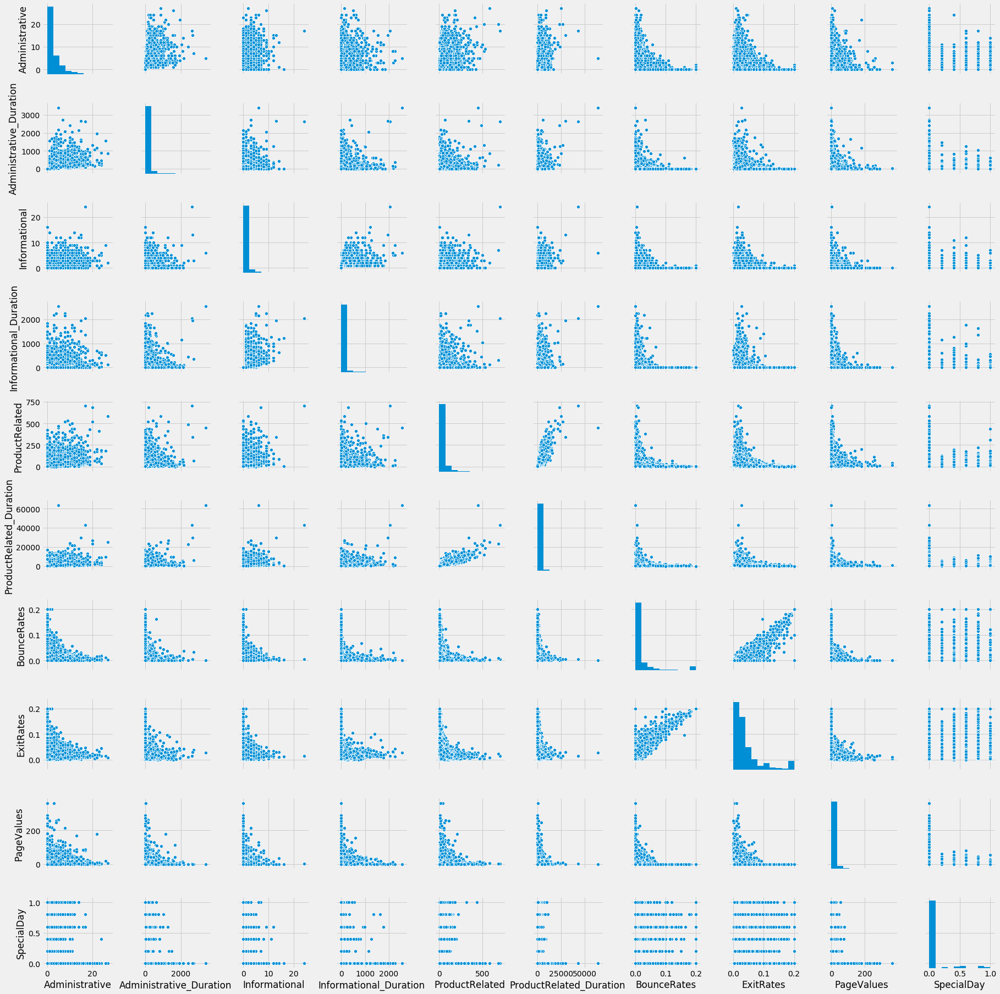

In [170]:
sns.pairplot(df[num_feats])

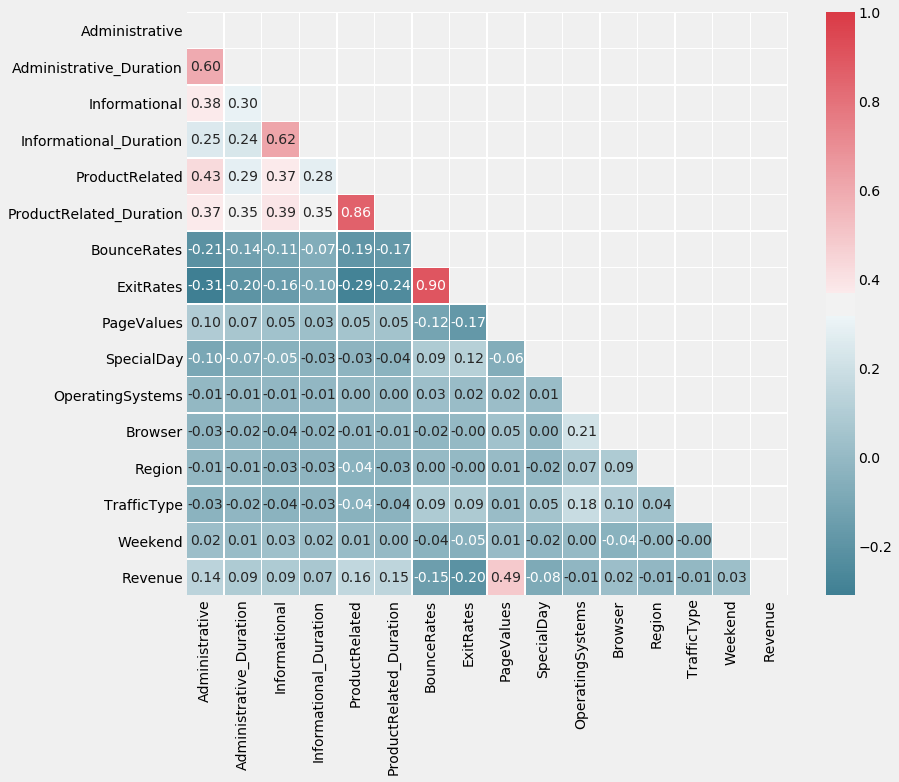

In [171]:
corr = df.corr('pearson')
fig, ax = plt.subplots(figsize=(12, 10))
colormap = sns.diverging_palette(220, 10, as_cmap=True)
dropSelf = np.zeros_like(corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
sns.heatmap(corr, cmap=colormap, linewidths=.5, annot=True, fmt=".2f", mask=dropSelf)
plt.show()

Administrative/Informational/ProductRelated pageview <--> its counterpart duration is HIGHLY correlated (60% - 86%)<br>
To reduce features + solve autocorrelation, consider creating interaction variable as below?
* Administrative = Administrative * Administrative_Duration
* Informational = Informational * Administrative_Duration
* ProductRelated = ProductRelated * Administrative_Duration
which is a sum of information contained in both variable.<br>


<br>
Also note: ExitRates <--> BounceRates (90%!)


<br>
It's natural for PageValues to be correlated to Revenue (49%), since visitor will visit billing pages before purchase

In [318]:
df.groupby('Revenue').agg('mean')[num_feats]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay
Revenue,,,,,,,,,,
False,2.146149,74.727678,0.457701,30.638960,29.082944,1084.268519,0.023169,0.045460,2.002513,0.069214
True,3.393606,119.483244,0.786164,57.611427,48.210168,1876.209615,0.005117,0.019555,27.264518,0.023166


In [340]:
df.groupby('TrafficType').agg('mean')[[
    'BounceRates', 'ExitRates', 'PageValues']].sort_values(by='BounceRates', ascending=False)

,BounceRates,ExitRates,PageValues
TrafficType,,,
15,0.068251,0.086408,0.038494
17,0.050000,0.075000,0.000000
13,0.046556,0.068439,2.390212
18,0.033128,0.053055,0.000000
3,0.030184,0.054423,3.339503
1,0.027716,0.051701,3.556651
19,0.025751,0.049762,3.497520
20,0.023066,0.043599,15.520252
11,0.022210,0.043753,5.068642


In [336]:
traffic_conversion = pd.crosstab(df.TrafficType, 
                            df.Revenue,
                            margins=True, 
                            margins_name="Total"
)
traffic_conversion['ConversionRate (%)'] = round(traffic_conversion[True]/traffic_conversion['Total']*100, 2)
traffic_conversion.sort_values(by='ConversionRate (%)', ascending=False)

Revenue,False,True,Total,ConversionRate (%)
TrafficType,,,,
16,2,1,3,33.33
7,28,12,40,30.00
8,248,95,343,27.70
20,143,50,193,25.91
2,3060,847,3907,21.68
5,204,56,260,21.54
10,360,90,450,20.00
11,200,47,247,19.03
Total,10284,1908,12192,15.65


In [335]:
pd.crosstab(df.TrafficType, 
            df.Revenue,
            values=df.PageValues,
            aggfunc='median'
#             margins=True, 
#             margins_name="Total"
           ).round(2).sort_values(by=True, ascending=False)

Revenue,False,True
TrafficType,,
19,0.0,56.36
7,0.0,39.31
20,0.0,37.52
9,0.0,30.25
14,0.0,27.77
4,0.0,24.29
6,0.0,20.97
5,0.0,20.47
2,0.0,17.22


In [262]:
fig = px.scatter(df, x="Administrative_Duration", y="Administrative", color="Revenue")
fig.show()

fig = px.scatter(df, x="Informational_Duration", y="Informational", color="Revenue")
fig.show()

fig = px.scatter(df, x="ProductRelated_Duration", y="ProductRelated", color="Revenue")
fig.show()

In [295]:
fig = px.scatter(df, x="BounceRates", y="ExitRates", color="Revenue")
fig.show()

In [292]:
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

fig = go.Figure()
fig.add_trace(go.Bar(
    x=months,
    y=[i for i in df[df['Revenue']==True]['Month'].value_counts().reindex(months).values],
    name='Purchased',
    marker_color='mediumvioletred'
))
fig.add_trace(go.Bar(
    x=months,
    y=[i for i in df[df['Revenue']==False]['Month'].value_counts().reindex(months).values],
    name='Did not purchase',
    marker_color='slategrey'
))

# # Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45,
                 title='Number of Transactions by Month',
                   xaxis_title='Month',
                   yaxis_title='Number of Transactions')
fig.show()

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x=months, 
                         y=[i for i in df[df['Revenue']==True]['Month'].value_counts().reindex(months).values], 
                         name = 'Purchased',
                         line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=months, 
                         y=[i for i in df[df['Revenue']==False]['Month'].value_counts().reindex(months).values], 
                         name='Did not purchase',
                         line=dict(color='firebrick', width=4) # dash options include 'dash', 'dot', and 'dashdot'
))

# Edit the layout
fig.update_layout(title='Line Chart',
                   xaxis_title='Month',
                   yaxis_title='Number of Transactions')


fig.show()

In [289]:
regions=df["Region"].value_counts()

# pie plot
fig = px.pie(regions,
             values=regions.values,
             names=regions.index,
             title="From what regions do visitors come from?",
             color_discrete_sequence=px.colors.diverging.curl)
fig.update_traces(rotation=-90, textinfo="percent+label")
fig.show()

In [293]:
rev_true_labels = [i for i in df[df['Revenue']==True]['TrafficType'].value_counts().sort_index().index]
rev_true_values = [i for i in df[df['Revenue']==True]['TrafficType'].value_counts().sort_index().values]
rev_false_labels = [i for i in df[df['Revenue']==False]['TrafficType'].value_counts().sort_index().index]
rev_false_values = [i for i in df[df['Revenue']==False]['TrafficType'].value_counts().sort_index().values]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, 
                    cols=2, 
                    specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Purchased', 'Did not purchase']
                   )
fig.add_trace(go.Pie(labels=rev_true_labels, 
                     values=rev_true_values, 
                     name="1", 
                     scalegroup='one',
                    ),
              1, 1
             )
fig.add_trace(go.Pie(labels=rev_false_labels, 
                     values=rev_false_values, 
                     name="0", 
                     scalegroup='one'),
              1, 2
             )

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="From which channels do visitors come from?",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='', x=0.18, y=0.5, font_size=10, showarrow=False),
                 dict(text='', x=0.82, y=0.5, font_size=10, showarrow=False)])
fig.show()

In [290]:
visitors=df['VisitorType'].value_counts()

# pie plot
fig = px.pie(visitors,
             values=visitors.values,
             names=visitors.index,
             title="What's the composition of our visitors?",
             color_discrete_sequence=px.colors.diverging.Portland)
fig.update_traces(rotation=-90, textinfo="percent+label")
fig.show()

visitors=[i for i in df['VisitorType'].unique()]

fig = go.Figure(data=[
    go.Bar(name='Purchased', 
           x=visitors, 
           y=[i for i in df[df['Revenue']==True]['VisitorType'].value_counts().reindex(visitors).values], 
           marker_color='mediumvioletred'
          ),
    go.Bar(name='Did not purchase', 
           x=visitors, 
           y=[i for i in df[df['Revenue']==False]['VisitorType'].value_counts().reindex(visitors).values], 
           marker_color='slategrey'),
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

# visitors=[i for i in df['VisitorType'].unique()]

# fig = go.Figure()
# fig.add_trace(go.Bar(
#     y=visitors,
#     x=[i for i in df[df['Revenue']==True]['VisitorType'].value_counts().reindex(visitors).values],
#     name='Purchased',
#     orientation='h'
# ))
# fig.add_trace(go.Bar(
#     y=visitors,
#     x=[i for i in df[df['Revenue']==False]['VisitorType'].value_counts().reindex(visitors).values],
#     name='Did not purchase',
#     orientation='h'
# ))

# fig.update_layout(barmode='stack')
# fig.show()

In [255]:
weekend=[i for i in df['Weekend'].unique()]

fig = go.Figure(data=[
    go.Bar(name='Purchased', 
           x=weekend, 
           y=[i for i in df[df['Revenue']==True]['Weekend'].value_counts().reindex(weekend).values], 
           marker_color='mediumvioletred'
          ),
    go.Bar(name='Did not purchase', 
           x=weekend, 
           y=[i for i in df[df['Revenue']==False]['Weekend'].value_counts().reindex(weekend).values], 
           marker_color='slategrey'),
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

## Preprocessing

In [114]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for column in ['Month', 'VisitorType', 'Weekend', 'Revenue']:
    df[column] = label_encoder.fit_transform(df[column])
    print({index: label for index, label in enumerate(label_encoder.classes_)})
    print(f'{column} encoded')

{0: 'Aug', 1: 'Dec', 2: 'Feb', 3: 'Jul', 4: 'June', 5: 'Mar', 6: 'May', 7: 'Nov', 8: 'Oct', 9: 'Sep'}
Month encoded
{0: 'New_Visitor', 1: 'Other', 2: 'Returning_Visitor'}
VisitorType encoded
{0: False, 1: True}
Weekend encoded
{0: False, 1: True}
Revenue encoded


In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12192 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12192 non-null  float64
 1   Administrative_Duration  12192 non-null  float64
 2   Informational            12192 non-null  float64
 3   Informational_Duration   12192 non-null  float64
 4   ProductRelated           12192 non-null  float64
 5   ProductRelated_Duration  12192 non-null  float64
 6   BounceRates              12192 non-null  float64
 7   ExitRates                12192 non-null  float64
 8   PageValues               12192 non-null  float64
 9   SpecialDay               12192 non-null  float64
 10  Month                    12192 non-null  int32  
 11  OperatingSystems         12192 non-null  int64  
 12  Browser                  12192 non-null  int64  
 13  Region                   12192 non-null  int64  
 14  TrafficType           

In [116]:
X = df.iloc[:,:17]
y = df.iloc[:,17]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

for data in [x_train, x_test, y_train, y_test]:
    print(data.shape[0])

9753
2439
9753
2439


## Spot Check Classification Algorithms

Due to imbalanced classes, with BUY class as minority, classifiers did not perform well to predict the event (precision and recall averaging as low as 50%)<br>
Sakar (2018) used oversampling to mitigate this problem and improves metrics to 80% range

Error to focus on --> Customers that we thought would buy but actually did not buy --> False positive (FP) --> Lost revenue <br>
This is the conservative take, for follow-up action we also can devise incentives to purchase<br>
Instead of customers that we thought would NOT buy but actually did buy --> that's good news, nothing to worry about<br>

__Clustering possible to study types of customers that would/would not buy?__

### LogReg

Train score: 88.18%
Test score: 88.15%
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      2057
           1       0.75      0.36      0.49       382

    accuracy                           0.88      2439
   macro avg       0.82      0.67      0.71      2439
weighted avg       0.87      0.88      0.86      2439



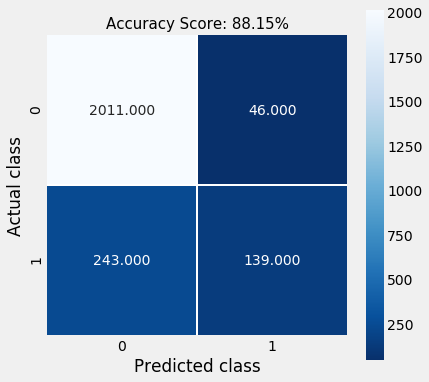

In [117]:
# LOGISTIC REGRESSION
classifier = LogisticRegression(solver='newton-cg')
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%')

accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = f'{round(accuracy*100, 2)}%'

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_percentage)
plt.title(all_sample_title, size = 15)
plt.show()

### Naive Bayes

Train score: 84.64%
Test score: 84.83%
              precision    recall  f1-score   support

           0       0.91      0.91      0.91      2057
           1       0.52      0.52      0.52       382

    accuracy                           0.85      2439
   macro avg       0.71      0.72      0.71      2439
weighted avg       0.85      0.85      0.85      2439



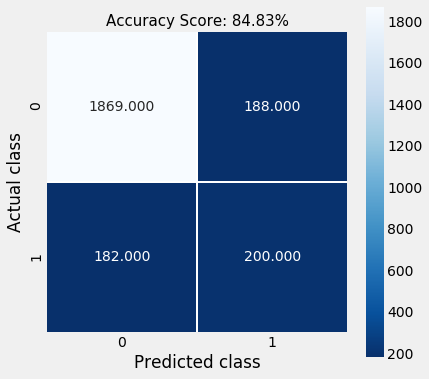

In [119]:
# NAIVE BAYES
classifier = GaussianNB()
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%')

accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = f'{round(accuracy*100, 2)}%'

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_percentage)
plt.title(all_sample_title, size = 15)
plt.show()

### DT

Train score: 100.0%
Test score: 85.81%
              precision    recall  f1-score   support

           0       0.91      0.92      0.92      2057
           1       0.55      0.53      0.54       382

    accuracy                           0.86      2439
   macro avg       0.73      0.73      0.73      2439
weighted avg       0.86      0.86      0.86      2439



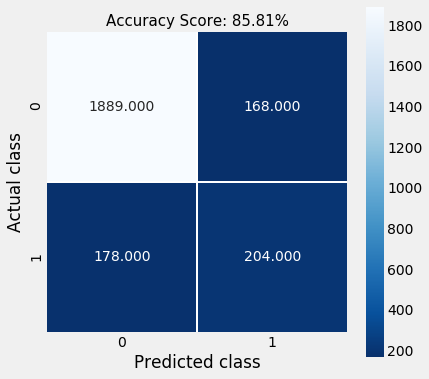

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.745908 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.745908 to fit



In [127]:
# DECISION TREE
classifier = DecisionTreeClassifier()
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%')

accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = f'{round(accuracy*100, 2)}%'

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_percentage)
plt.title(all_sample_title, size = 15)
plt.show()

# VISUALIZE TREE
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_train.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DT Purchase.png')
Image(graph.create_png())

### RF

Train score: 100.0%
Test score: 89.91%
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2057
           1       0.73      0.56      0.63       382

    accuracy                           0.90      2439
   macro avg       0.83      0.76      0.79      2439
weighted avg       0.89      0.90      0.89      2439



Text(0.5, 1, 'Accuracy Score: 89.91%')

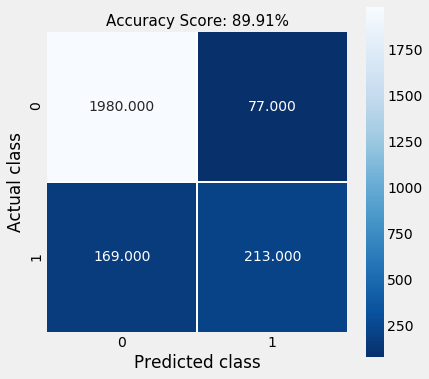

In [122]:
# RANDOM FOREST
classifier = RandomForestClassifier(n_estimators=100, 
                                    max_depth=50, 
                                    min_samples_leaf=1, 
                                    min_samples_split=2)
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%')

accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = f'{round(accuracy*100, 2)}%'

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_percentage)
plt.title(all_sample_title, size = 15)

### SVM

Train score: 88.38%
Test score: 88.72%
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      2057
           1       0.79      0.38      0.51       382

    accuracy                           0.89      2439
   macro avg       0.84      0.68      0.73      2439
weighted avg       0.88      0.89      0.87      2439



Text(0.5, 1, 'Accuracy Score: 88.72%')

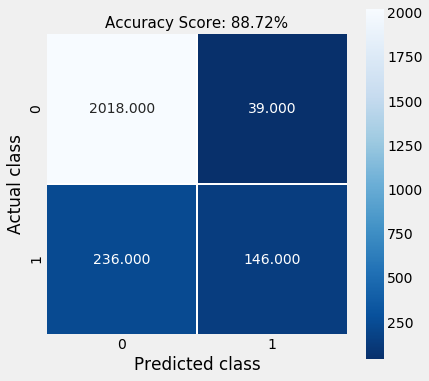

In [128]:
# SUPPORT VECTOR MACHINES
classifier = svm.SVC(kernel='linear')
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%')

accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = f'{round(accuracy*100, 2)}%'

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_percentage)
plt.title(all_sample_title, size = 15)